## Poster Genre Classification

This file aims at classifying the movies, using the corresponding posters. The original poster images have already been collected and stored on Google Cloud in the file 'FinalProject - Data Collection.ipython'. The original dataset is gained from Kaggle (https://www.kaggle.com/neha1703/movie-genre-from-its-poster) and images are gained from the website of IMBD. 

In [1]:
# Import packages
import tensorflow as tf
from tensorflow.keras.preprocessing import image

import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import shutil
from tqdm import tqdm
import functools
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import io

from google.colab import drive

AUTOTUNE = tf.data.experimental.AUTOTUNE
BATCH_SIZE = 32
SHUFFLE_SIZE = 1024
IMG_SIZE = 224


### Retrieve Image Folder and CSV File from Google Cloud

As mentioned above, the movie dataset and the poster images are stored in Google cloud bucket. Therefore, the first step is to retrieve the data from Google Cloud. 

In [2]:
root = '/content'

In [3]:
# Download files using the given URL if they do not exist in the current directory
def download_if_missing(url, target, extract=True):
  if os.path.exists(target):
    return target
  return tf.keras.utils.get_file(target, origin=url, extract=extract)

In [4]:
# Download the csv file and the image folder 
csv_url = 'https://storage.googleapis.com/coms4995_final_project_yc/collected_dataframe.csv'
image_url = 'https://storage.googleapis.com/coms4995_final_project_yc/Data.zip'
csv_path = os.path.join(root, "data.csv")
image_zip_path = os.path.join(root, "image.zip")
download_if_missing(csv_url, csv_path)
download_if_missing(image_url, image_zip_path)



'/content/image.zip'

In [5]:
# Unzip the image folder if they have not been upzipped
image_path = os.path.join(root, "image")
if os.path.exists(image_path) == False:
  !unzip -q $image_zip_path -d $image_path
image_path = os.path.join(image_path, "Data")

In [6]:
# Load the csv file as dataframe 
df = pd.read_csv(csv_path)

# Replace the links in the 'Poster' column of the dataframe with the absolute paths
df['Poster'] = [os.path.join(image_path, i) for i in list(df['Poster'])]

# Drop out unnecessary columns 
df = df.drop(['imdbId', 'Imdb Link', 'IMDB Score'], axis = 1)

# Transform the strings of genres to a list of genres
df['Genre'] = [i.split("|") for i in list(df['Genre'])]

In [7]:
# Visualize the dataframe 
df.head(3)

,Title,Genre,Poster
0,Toy Story (1995),"[Animation, Adventure, Comedy]",/content/image/Data/MV5BMDU2ZWJlMjktMTRhMy00ZT...
1,Jumanji (1995),"[Action, Adventure, Family]",/content/image/Data/MV5BZTk2ZmUwYmEtNTcwZS00Ym...
2,Grumpier Old Men (1995),"[Comedy, Romance]",/content/image/Data/MV5BMjQxM2YyNjMtZjUxYy00OG...


As we can see above, there are multiple genre attachments from IMDB for each movie. Instead of classifying the movie to only one genre, the challenge becomes the multi-label genre classification. That is, we need to classfify the movies to their potential genres.

### Exploratory Data Analysis

Before we jump into multi-genre classification, we first need to look at our data. First of all, let's look at some of our images with their corresponding movie titles and genres. 

Title:  Toy Story (1995)
Genres:  ['Animation', 'Adventure', 'Comedy']


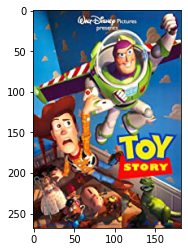

Title:  Jumanji (1995)
Genres:  ['Action', 'Adventure', 'Family']


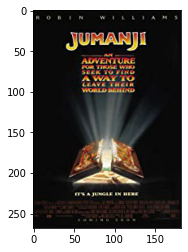

Title:  Grumpier Old Men (1995)
Genres:  ['Comedy', 'Romance']


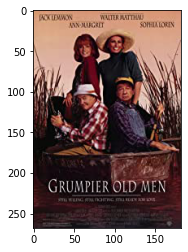

In [8]:
# Visualize some images with titles and genre attachments
example_size = 3
for i in range(3):
  record = df.iloc[i]
  print("Title: ", record['Title'])
  print("Genres: ", record['Genre'])
  img = mpimg.imread(record['Poster'])
  pic = plt.imshow(img)
  plt.show()

#### Image Size

The size of each image is the same for all images in the folder. Therefore, here we only check the first one. 

In [9]:
# Size of the image
img = Image.open(df.loc[0, 'Poster'])
print("The original size of the image: ", img.size)

The original size of the image:  (182, 268)


#### Genres

Each poster has one or multiple genre attachment(s). Let's first look at the number of unique genres in the dataset and the distribution of the number of genres for each user in the dataset. 

In [10]:
genre_list = list(df['Genre'])
unique_genre = []
for i in range(len(genre_list)):
  unique_genre += genre_list[i]
unique_genre = set(unique_genre)
print("There are ", len(unique_genre), " unique genres in the dataset. ")
print("They are: ", unique_genre)

unique_genre = list(unique_genre)

# Sort the list of unique genres depending on their alphabetical order
unique_genre = sorted(unique_genre, key=lambda word: (word[0] != 'x', word))

There are  28  unique genres in the dataset. 
They are:  {'Mystery', 'Comedy', 'Thriller', 'News', 'Musical', 'Fantasy', 'Romance', 'Biography', 'War', 'Action', 'Adult', 'History', 'Film-Noir', 'Reality-TV', 'Animation', 'Game-Show', 'Adventure', 'Documentary', 'Family', 'Music', 'Western', 'Drama', 'Sport', 'Talk-Show', 'Short', 'Crime', 'Sci-Fi', 'Horror'}


### Map genres to numeric vectors 

Instead of directly using the lists of genres into the classification process, we need to transform the original lists into their vectorized forms. It means that we need to use vectors to represent the existence of each genre for each movie. All vectors have the same length, which is the number of unique genre - 28. If the original list of genres contains Genre A, B, C, the values at the corresponding indices of the vector become 1. Others are 0s. 

In [11]:
ds = pd.read_csv(csv_path)
x = ds.set_index('Title').Genre.str.split(r'|', expand=True).stack().reset_index(level=1, drop=True).to_frame('genre')
dummy = pd.get_dummies(x, columns = ['genre'])
dummy.reset_index(level=0, inplace = True)
dummy_ds = dummy.groupby('Title').sum()
dummy_ds.reset_index(level=0, inplace = True)

In [12]:
data = pd.merge(df, dummy_ds, left_on = 'Title', right_on = 'Title', how = 'inner')
data = data.drop(['Genre'], axis = 1)
data.columns = ['Title', 'Poster'] + unique_genre

Let's look at some examples of the vectorized data. 

In [13]:
# Display the vectorized dataset
data.head(3)

,Title,Poster,Action,Adult,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,Family,Fantasy,Film-Noir,Game-Show,History,Horror,Music,Musical,Mystery,News,Reality-TV,Romance,Sci-Fi,Short,Sport,Talk-Show,Thriller,War,Western
0,Toy Story (1995),/content/image/Data/MV5BMDU2ZWJlMjktMTRhMy00ZT...,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Jumanji (1995),/content/image/Data/MV5BZTk2ZmUwYmEtNTcwZS00Ym...,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Grumpier Old Men (1995),/content/image/Data/MV5BMjQxM2YyNjMtZjUxYy00OG...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


#### Distribution of Genre Attachments

Next, let's look at the distribution of the number of genre attachments for movies. 

In [14]:
# Calculate the number of genre attachments for each movie
genre_count = dict.fromkeys(unique_genre,0)
all_genre_attachment = x['genre']
for g in all_genre_attachment:
  genre_count[g] += 1

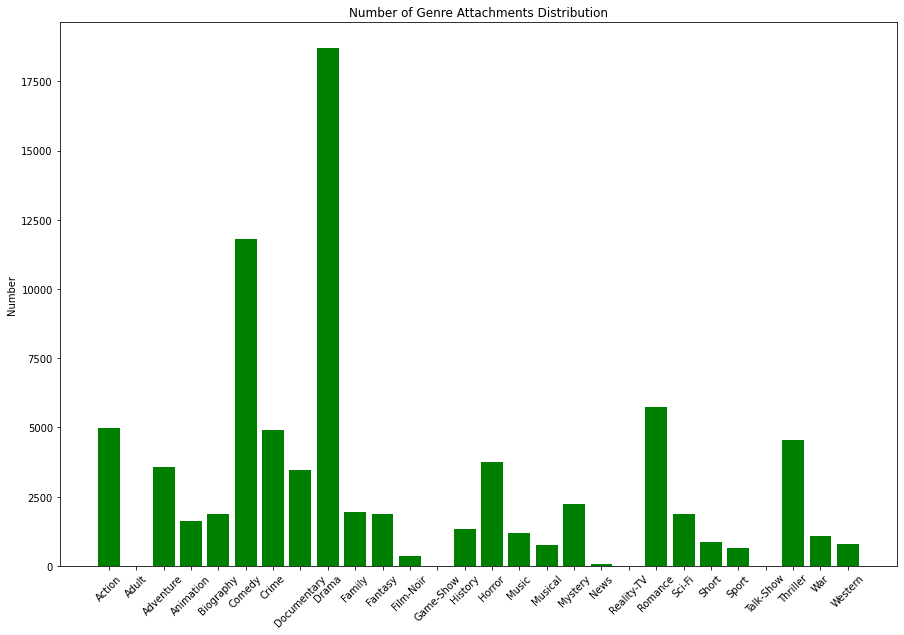

In [15]:
# Visualize the distribution
plt.figure(figsize = (15,10))
plt.bar(genre_count.keys(), genre_count.values(), color='g')
plt.xticks(rotation = 45)
plt.title("Number of Genre Attachments Distribution")
plt.ylabel("Number")
plt.show()

From the above distribution plot, we could know that there is an imbalance in the current dataset. The genres, 'Drama' (Index: 8) and 'Comedy' (Index: 5), appear much more frequently than other genres. This imbalance might create bias in the later sections of model building and prediction. Therefore, we need to apply data augmentation on the minority genres.

### Train-Validation-Test Split

Before we do data augmentation, we need to split the original dataset into three parts, 70% for training, 15% for validation, and the remaining 15% for testing. 

In [16]:
# Training split
train_df, test_df = train_test_split(data, train_size = 0.7)
print("The number of training images: ", len(train_df))
validation_df, test_df = train_test_split(test_df, train_size = 0.5)
print("The number of validation images: ", len(validation_df))
print("The number of test images: ", len(test_df))

The number of training images:  25907
The number of validation images:  5551
The number of test images:  5552


In [17]:
# Split the data into the independent variable (poster image) and the 
# dependent variable (poster genres) which is our target
X_train = list(train_df['Poster'])
y_train = np.array(train_df.drop(['Title', 'Poster'], axis = 1)).astype(np.int64)
X_validation = list(validation_df['Poster'])
y_validation = np.array(validation_df.drop(['Title', 'Poster'], axis=1)).astype(np.int64)
X_test = list(test_df['Poster'])
y_test = np.array(test_df.drop(['Title', 'Poster'], axis = 1)).astype(np.int64)

In [18]:
print(X_train[0], y_train[0])

/content/image/Data/MV5BMTI0NTA3MjI3NV5BMl5BanBnXkFtZTcwNTI1ODYzMQ@@._V1_UX182_CR0,0,182,268_AL_.jpg [0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [19]:
# Print the list of original genres from its vectorized form
def vec_to_genre(vec_genre):
  index = np.where(vec_genre == 1)[0]
  original_genre = [unique_genre[i] for i in index]
  return original_genre

### Use Tensorflow to read images

In [20]:
# Decode the original image file into tensorflow image arrays 
def image_decode(img_path, genre, training = False):
  img= tf.io.read_file(img_path)
  img = tf.image.decode_jpeg(img, channels=3)
  if training:
    img = augmentation(img, genre)
  img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
  result = img / 255.0
  return result, genre

In [21]:
# Apply data augmentation for minority groups to deal with issue of imbalance
def augmentation(img_path, genre):
  if genre[8] != 1 and genre[5] != 1:
    img_path = tf.image.random_flip_left_right(img_path)
    img_path = tf.image.random_flip_up_down(img_path)
    img_path = tf.image.random_hue(img_path, 0.08)
    img_path = tf.image.random_brightness(img_path, 0.05)
    img_path= tf.image.random_contrast(img_path, 0.7, 1.3)
  return img_path

### Batch and Shuffle Training Data for Modeling

In [22]:
# Load images and genres as pairs and transform them into tensorflow dataset
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
partial_fun = functools.partial(image_decode, training = True)
train_ds = train_ds.map(partial_fun, num_parallel_calls=AUTOTUNE)

In [23]:
# Shuffle the train dataset and run it as batch
train_ds = train_ds.cache()
train_ds = train_ds.shuffle(buffer_size=1000)
train_ds = train_ds.batch(BATCH_SIZE)

In [24]:
# Apply the same procedure to validation dataset except the shuffling step
validation_ds = tf.data.Dataset.from_tensor_slices((X_validation, y_validation))
validation_ds = validation_ds.map(image_decode, num_parallel_calls=AUTOTUNE)
validation_ds = validation_ds.cache()
validation_ds = validation_ds.batch(BATCH_SIZE)

### Apply Neural Network models in Multi-label Classification

During this step, train the neural network with the training dataset. Due to the limited number of training data, we utilize the idea of transfer learning, where we use layers/models pretrained on a large dataset on our training data. In the model, we apply the feature_extractor_layer, which are feature vectors of images with MobileNet V2 trained on ImageNet (https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5). One important thing to point out is that the sizes of the input images are required to be 224 * 224 pixels to fit the layer of feature vectors. Therefore, during the image preprocessing step, we set the sizes of the input images to be 224 * 224. 

In [25]:
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.models import Sequential
import tensorflow_hub as hub

In [26]:
genre_num = len(unique_genre) # Number of unique genres

In [27]:
# Retrieve the pretrained layer of features vectors from Tensorflow Hub
feature_extractor_url = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5"
feature_extractor_layer = hub.KerasLayer(feature_extractor_url, input_shape=(IMG_SIZE,IMG_SIZE,3))
feature_extractor_layer.trainable = False

In [28]:
model = Sequential()
model.add(feature_extractor_layer)
model.add(Dense(1024, activation = 'relu'))
model.add(Dropout(0.3))
model.add(Dense(genre_num, activation='sigmoid'))

In [29]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1280)              2257984   
_________________________________________________________________
dense (Dense)                (None, 1024)              1311744   
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 28)                28700     
Total params: 3,598,428
Trainable params: 1,340,444
Non-trainable params: 2,257,984
_________________________________________________________________


In [30]:
# Use Binary loss to predict the values (or we could treat it as "probability"), 
# ranging from 0 to 1, for each unique genres (28 for each movie)
model.compile(optimizer='adam',
              loss='binary_crossentropy', 
              metrics=['accuracy'])

In [31]:
EPOCHS = 10

In [32]:
history = model.fit(train_ds, epochs=EPOCHS, validation_data=validation_ds, batch_size = BATCH_SIZE)

Epoch 1/10
810/810 [==============================] - 80s 90ms/step - loss: 0.2208 - accuracy: 0.3145 - val_loss: 0.1958 - val_accuracy: 0.3560
Epoch 2/10
810/810 [==============================] - 32s 39ms/step - loss: 0.1931 - accuracy: 0.3684 - val_loss: 0.1942 - val_accuracy: 0.3664
Epoch 3/10
810/810 [==============================] - 31s 39ms/step - loss: 0.1885 - accuracy: 0.3737 - val_loss: 0.1929 - val_accuracy: 0.3740
Epoch 4/10
810/810 [==============================] - 29s 36ms/step - loss: 0.1851 - accuracy: 0.3871 - val_loss: 0.1926 - val_accuracy: 0.3601
Epoch 5/10
810/810 [==============================] - 30s 37ms/step - loss: 0.1813 - accuracy: 0.3918 - val_loss: 0.1945 - val_accuracy: 0.3790
Epoch 6/10
810/810 [==============================] - 31s 38ms/step - loss: 0.1773 - accuracy: 0.4027 - val_loss: 0.1939 - val_accuracy: 0.3580
Epoch 7/10
810/810 [==============================] - 30s 37ms/step - loss: 0.1730 - accuracy: 0.4142 - val_loss: 0.1954 - val_accuracy:

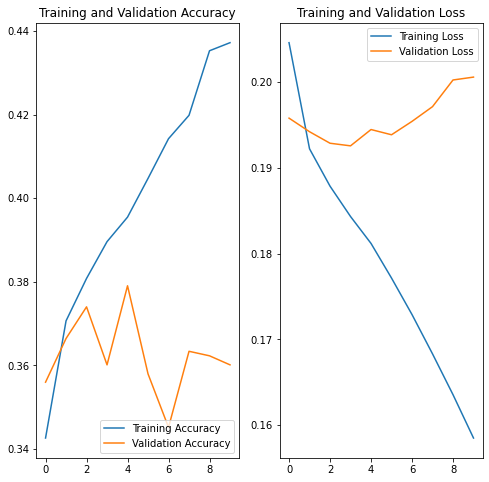

In [33]:
# Visualize the accuracy and loss during training 
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

As we could see from the result, although the validation accuracy does not improve a lot, it remains approximately stable (a little increase) while the training accuracy increases. The relative low validation accuracy might due to the limited amount of the training data and the format of the target variables (a vector of 28 values rangining from 0 to 1). 

In order to evaluate our model, we need to look at the model's performance on the test dataset and compare the results with the original values. 

### Model Prediction

Instead of directly giving out the predicted genres, our model produces a vector of 28 values ranging from 0 to 1 for each genre. We could treat this as a way of showing the probability for each genre. Therefore, we select the Top 5 genres predicted for each movie ordered by their predicted values. 

In [34]:
# Model Prediction
def prediction_comparison(image_files, genre_files, model, topk = 5):
  file = image_files
  img, genre = image_decode(file, genre_files)
  plt.imshow(img)
  plt.show()
  print("Original Genre Attachments: ", vec_to_genre(genre))
  
  # model prediction
  img = np.expand_dims(img, axis = 0)
  result = model.predict(img)
  index = np.argsort(-result)[0]
  final_result = [unique_genre[i] for i in index[0:topk]]
  print("Top Predicted Genres: ", final_result)
  return final_result

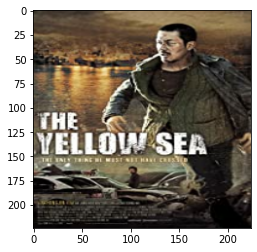

Original Genre Attachments:  ['Crime', 'Drama', 'Thriller']
Top Predicted Genres:  ['Drama', 'Action', 'Adventure', 'Thriller', 'Comedy']


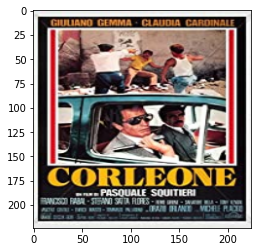

Original Genre Attachments:  ['Crime', 'Thriller']
Top Predicted Genres:  ['Drama', 'Comedy', 'Romance', 'Crime', 'Horror']


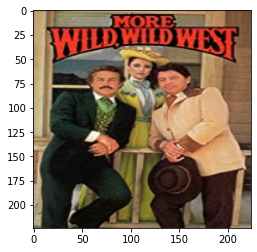

Original Genre Attachments:  ['Adventure', 'Comedy', 'Western']
Top Predicted Genres:  ['Comedy', 'Drama', 'Romance', 'Crime', 'Action']


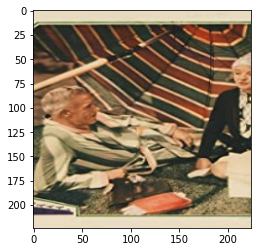

Original Genre Attachments:  ['Drama', 'Romance']
Top Predicted Genres:  ['Drama', 'Comedy', 'Romance', 'Western', 'History']


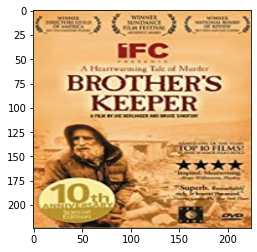

Original Genre Attachments:  ['Crime', 'Documentary', 'Mystery']
Top Predicted Genres:  ['Drama', 'Comedy', 'Biography', 'Romance', 'History']


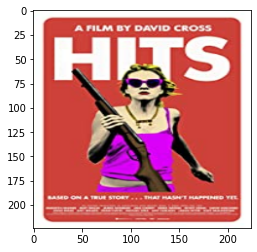

Original Genre Attachments:  ['Comedy', 'Drama']
Top Predicted Genres:  ['Comedy', 'Drama', 'Crime', 'Action', 'Romance']


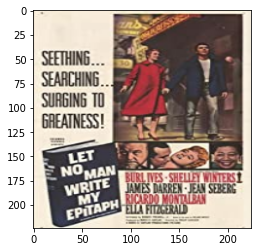

Original Genre Attachments:  ['Drama']
Top Predicted Genres:  ['Drama', 'Crime', 'Comedy', 'Documentary', 'Thriller']


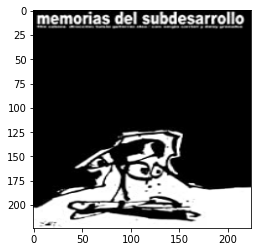

Original Genre Attachments:  ['Drama']
Top Predicted Genres:  ['Drama', 'Documentary', 'Biography', 'Music', 'Comedy']


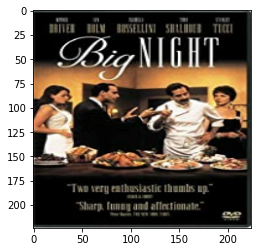

Original Genre Attachments:  ['Drama', 'Romance']
Top Predicted Genres:  ['Drama', 'Comedy', 'Romance', 'Crime', 'Biography']


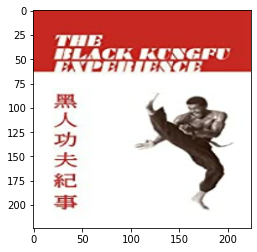

Original Genre Attachments:  ['Documentary', 'History']
Top Predicted Genres:  ['Drama', 'Comedy', 'Documentary', 'Romance', 'Family']


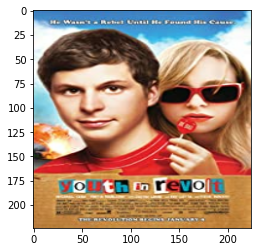

Original Genre Attachments:  ['Comedy', 'Drama', 'Romance']
Top Predicted Genres:  ['Drama', 'Comedy', 'Romance', 'Family', 'Biography']


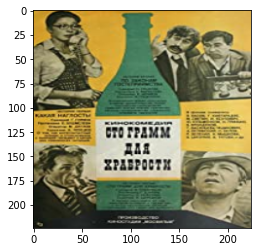

Original Genre Attachments:  ['Comedy']
Top Predicted Genres:  ['Drama', 'Crime', 'Comedy', 'Action', 'Thriller']


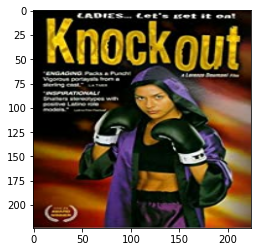

Original Genre Attachments:  ['Action', 'Drama']
Top Predicted Genres:  ['Drama', 'Comedy', 'Crime', 'Horror', 'Thriller']


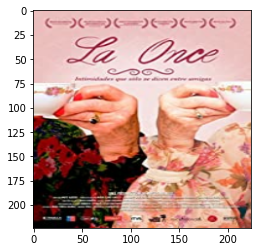

Original Genre Attachments:  ['Documentary']
Top Predicted Genres:  ['Drama', 'Comedy', 'Romance', 'Documentary', 'Biography']


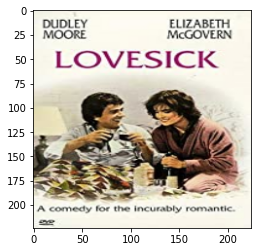

Original Genre Attachments:  ['Comedy', 'Fantasy', 'Romance']
Top Predicted Genres:  ['Drama', 'Romance', 'Comedy', 'Biography', 'Adventure']


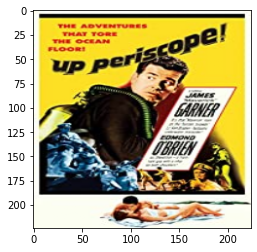

Original Genre Attachments:  ['Action', 'Drama', 'Romance']
Top Predicted Genres:  ['Drama', 'Western', 'Horror', 'Action', 'Thriller']


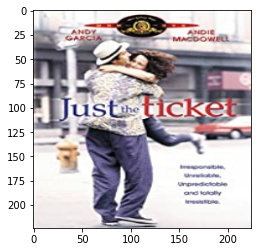

Original Genre Attachments:  ['Comedy', 'Romance']
Top Predicted Genres:  ['Drama', 'Comedy', 'Romance', 'Action', 'Crime']


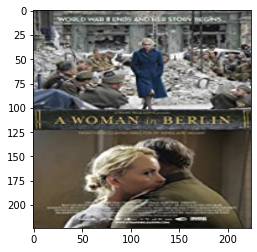

Original Genre Attachments:  ['Biography', 'Drama', 'History']
Top Predicted Genres:  ['Drama', 'Comedy', 'Romance', 'Action', 'Horror']


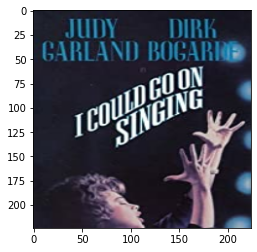

Original Genre Attachments:  ['Drama', 'Musical']
Top Predicted Genres:  ['Drama', 'Thriller', 'Comedy', 'Crime', 'Romance']


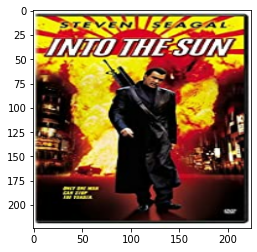

Original Genre Attachments:  ['Action', 'Adventure', 'Thriller']
Top Predicted Genres:  ['Action', 'Comedy', 'Drama', 'Adventure', 'Crime']
[3242, 1868, 5429, 1172, 191, 4734, 2427, 4868, 4360, 378, 3410, 1022, 1621, 3071, 1318, 3625, 3037, 1117, 3890, 248]


In [35]:
# Randomly select 20 images to show the prediction results
rand_index_list = []
for i in range(20):
  rand_index = random.randint(0, len(X_test))
  rand_index_list.append(rand_index)
  prediction_comparison(X_test[rand_index], y_test[rand_index], model)
print(rand_index_list)

### Prediction Results

Although the validation accuracy does not seem to be good, being around 0.36, the model does a good job in categorizing the genres depending on the limited number of posters it has. In fact, the results given by the model fits with the direct opinions given by ourselves. It captures the significant features/characteristics of each genre. For example, dark and red for horror or crime, aged texture for the genre of history, soft color for romance, etc. 

Besides, for the movies with only one genre attachment, the model performs really well on the classification. It might be due to the fact that for those kinds of movies, the posters are designed with clearer purposes and themes, using the colors or features that are keys to the corresponding genres. 

### Use the model to predict the genres of the transformed images

Next, we apply the model on the poster images that undergo style transformation. We would like to see whether the model could successfully capture the characteristics (colors, textures, etc) of the style. For this project, the style image we choose is the poster of 'Toy Story (1995)', which has the genre attachments of 'Comedy', 'Adventure', 'Animation'. We choose other images that originally do not have those genre attachments and transform them into new images using the style image in the file 'FinalProject - Poster Transformation.ipython'. In the following section, we would look like the proportions of those three genres in the predicted Top5 possible genre lists. 

In [36]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [37]:
directory_root = '/content/drive/MyDrive/FinalProjectTransformedImages'

In [38]:
transformed_image = []
for img in os.listdir(directory_root):
  transformed_image.append(os.path.join(directory_root, img))

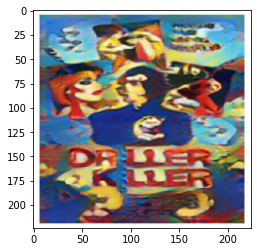

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


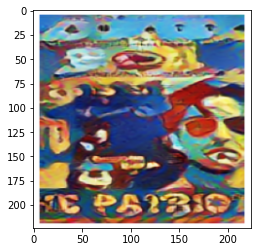

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


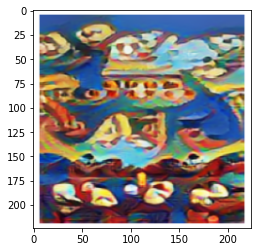

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Adventure', 'Family', 'Comedy']


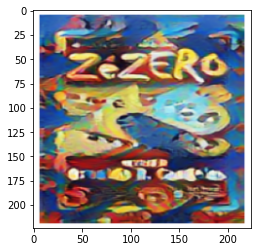

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


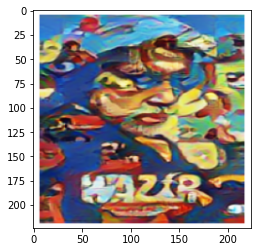

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Adventure', 'Comedy', 'Family']


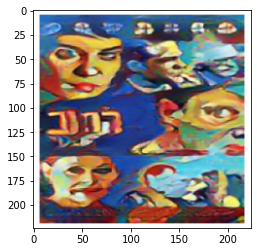

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Action']


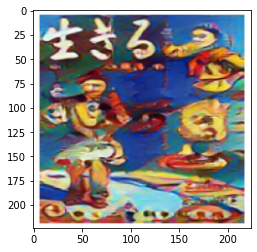

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Action', 'Family']


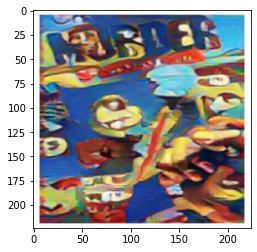

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Short']


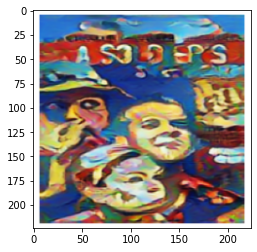

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


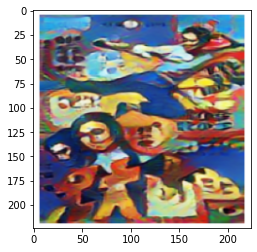

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Adventure', 'Family']


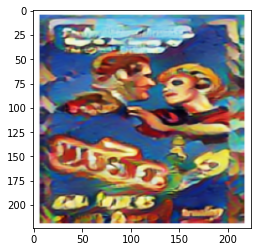

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Action', 'Family']


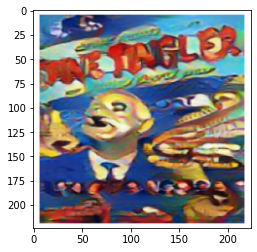

Original Genre Attachments:  []
Top Predicted Genres:  ['Comedy', 'Horror', 'Drama', 'Adventure', 'Family']


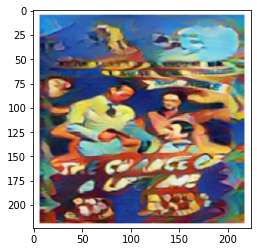

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Family', 'Comedy']


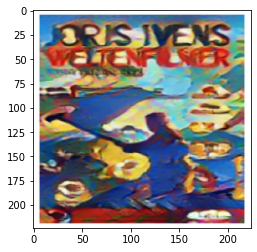

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Family', 'Comedy', 'Adventure', 'Action']


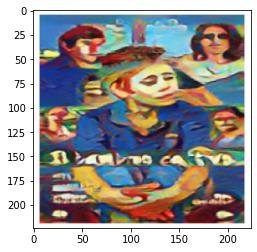

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Family', 'Comedy', 'Adventure', 'Action']


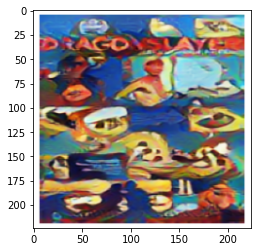

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Action']


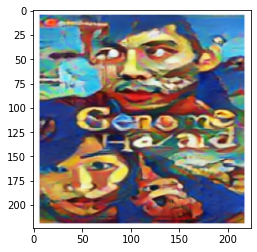

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Horror', 'Sci-Fi', 'Action']


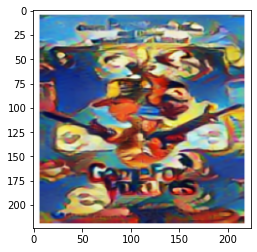

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Family', 'Adventure']


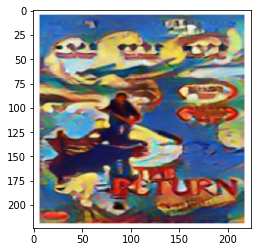

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


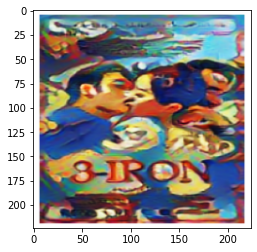

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


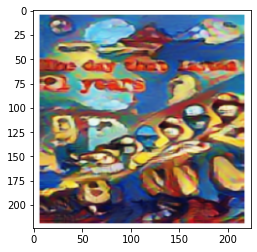

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Family', 'Adventure']


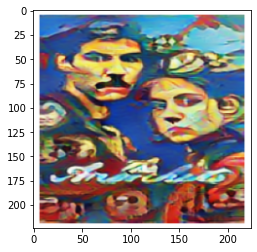

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Action', 'Fantasy']


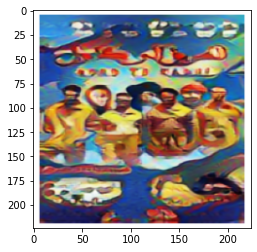

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Action']


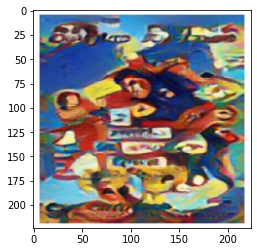

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Action']


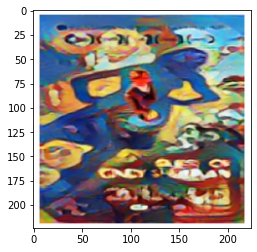

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


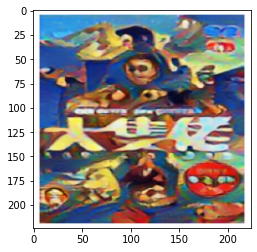

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


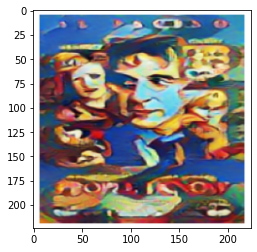

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Adventure', 'Sci-Fi']


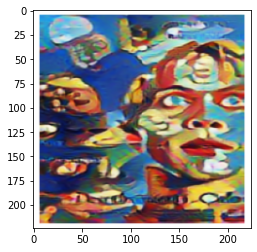

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


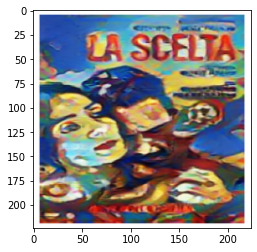

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Sci-Fi', 'Action']


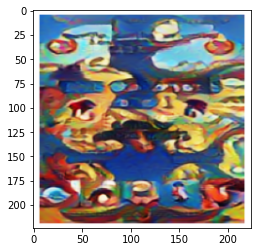

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


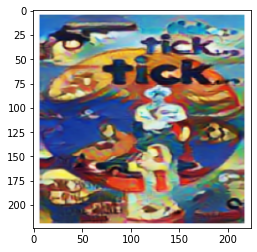

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


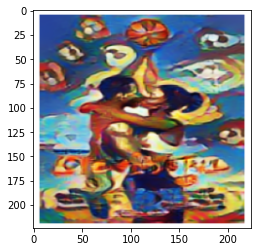

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Family', 'Adventure']


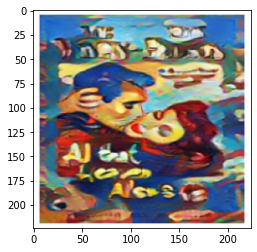

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


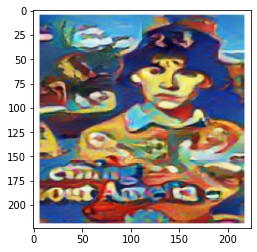

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Fantasy']


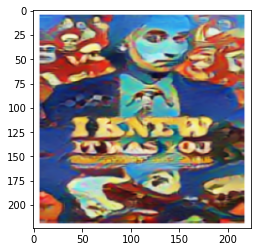

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Family', 'Comedy', 'Action']


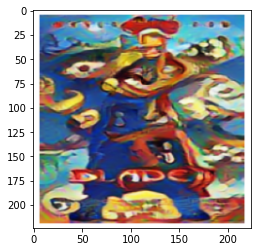

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


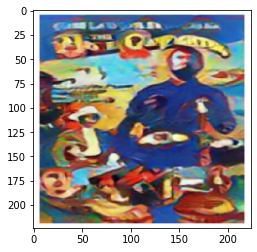

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Adventure', 'Family']


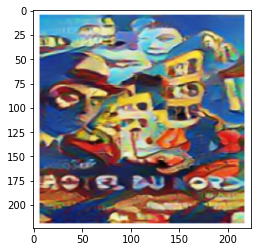

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Fantasy', 'Action', 'Comedy', 'Horror']


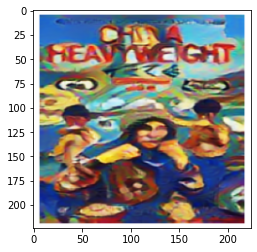

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Adventure', 'Family']


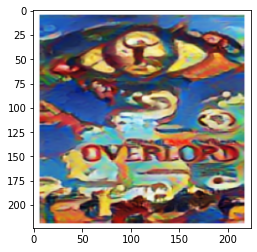

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


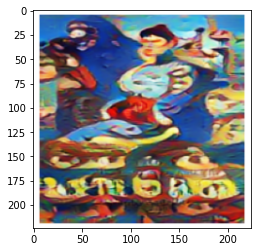

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Adventure', 'Family']


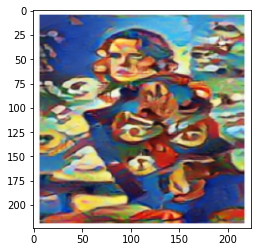

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Adventure', 'Comedy', 'Short']


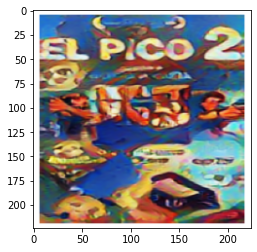

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Short']


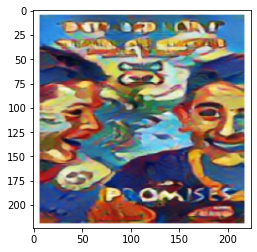

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Adventure', 'Comedy', 'Fantasy']


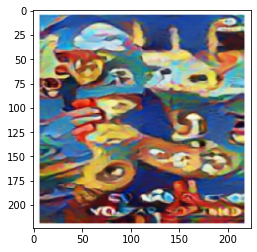

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Action', 'Family']


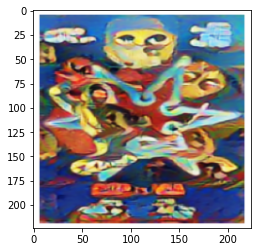

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


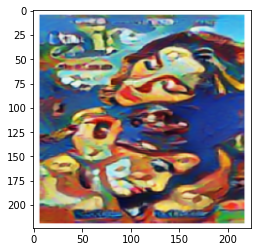

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Fantasy']


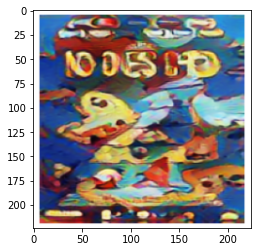

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


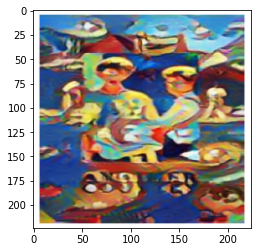

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Short', 'Action', 'Adventure']


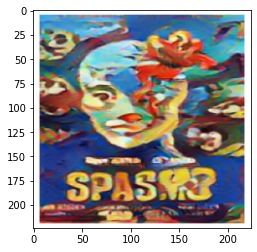

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Action']


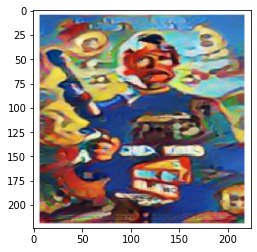

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Fantasy']


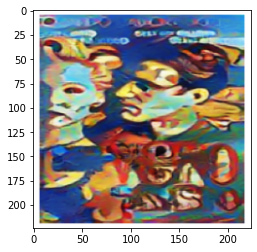

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


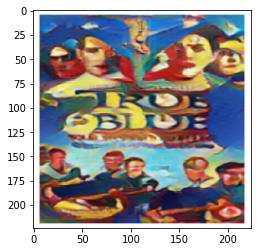

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Family', 'Comedy']


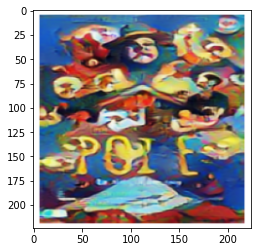

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Family', 'Comedy']


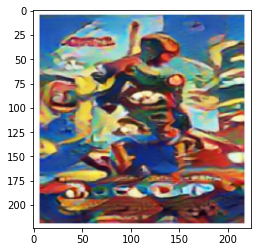

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


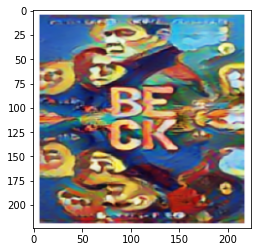

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Action']


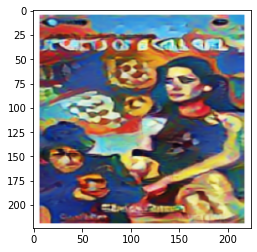

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Adventure', 'Horror']


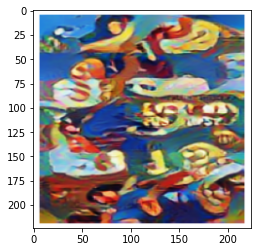

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Adventure', 'Comedy', 'Family']


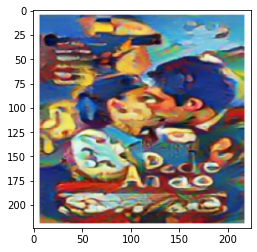

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Action', 'Adventure']


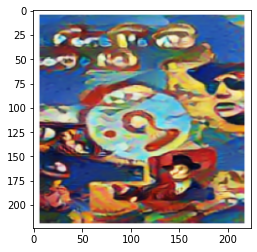

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Comedy', 'Family', 'Adventure']


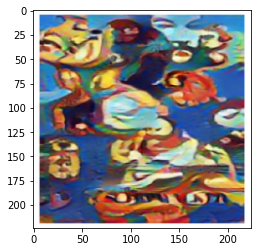

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Comedy', 'Adventure', 'Family']


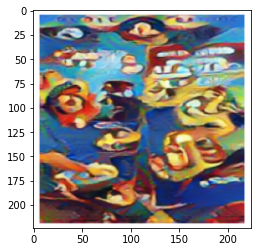

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Action', 'Family']


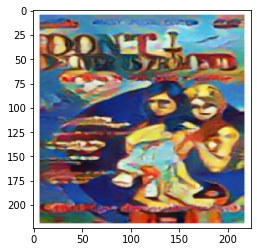

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


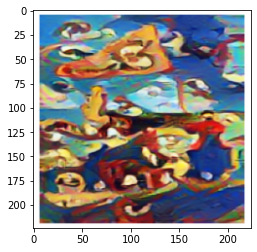

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


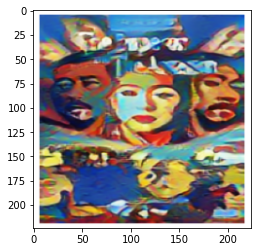

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Horror', 'Adventure', 'Action']


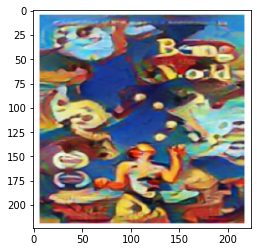

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


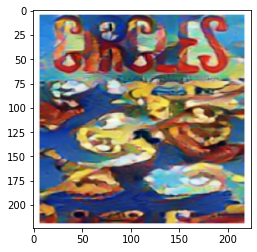

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Action', 'Adventure']


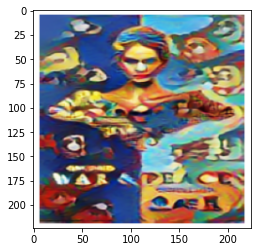

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Action']


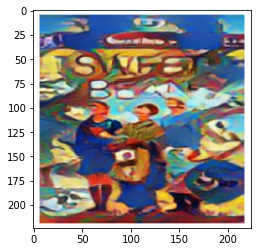

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Family', 'Adventure']


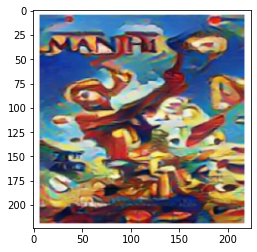

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Adventure', 'Comedy', 'Family']


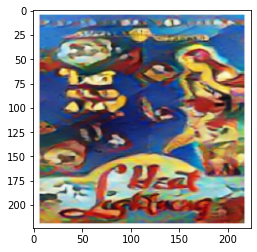

Original Genre Attachments:  []
Top Predicted Genres:  ['Comedy', 'Animation', 'Adventure', 'Drama', 'Fantasy']


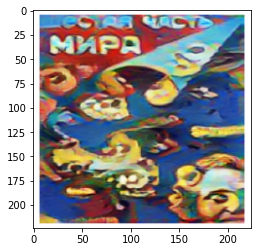

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Horror']


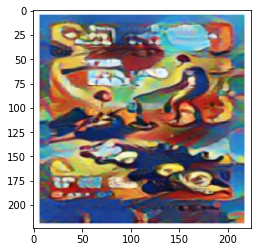

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Action', 'Family']


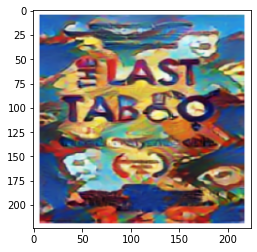

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Fantasy']


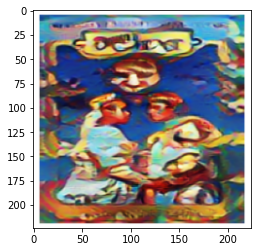

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Adventure', 'Family']


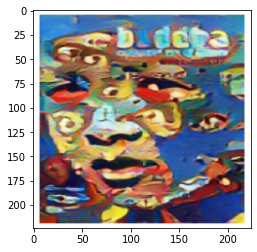

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Family', 'Action']


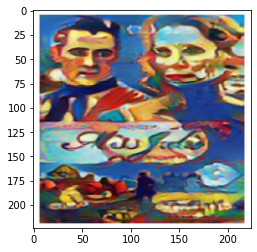

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


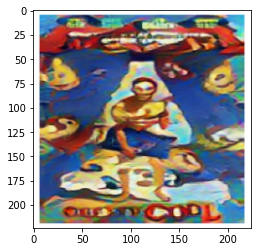

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


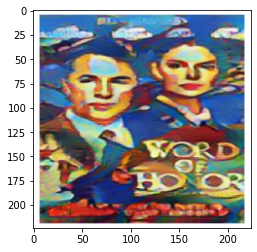

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Short']


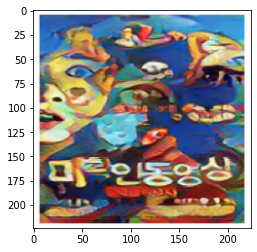

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Action', 'Adventure', 'Comedy', 'Fantasy']


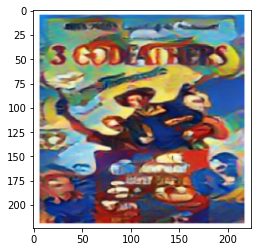

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Family', 'Adventure']


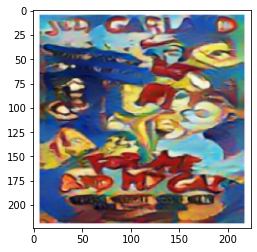

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Action', 'Adventure']


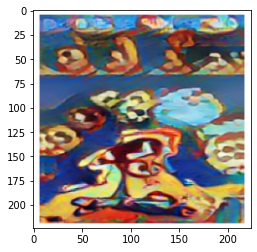

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


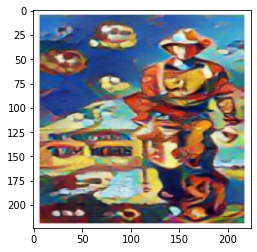

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


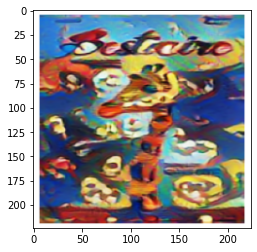

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Family', 'Adventure', 'Fantasy']


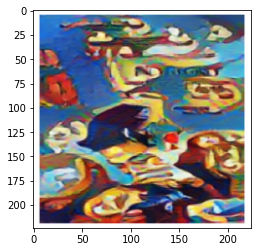

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Family', 'Action', 'Comedy']


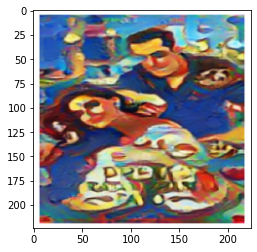

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


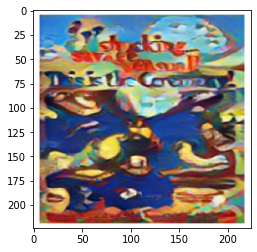

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Action', 'Family']


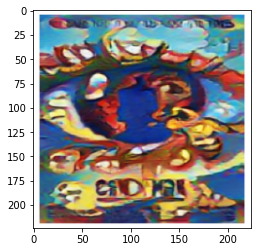

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


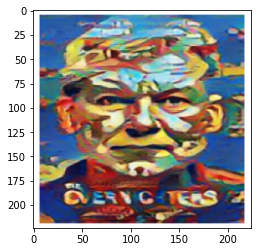

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Fantasy']


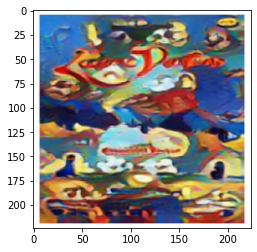

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Family', 'Adventure']


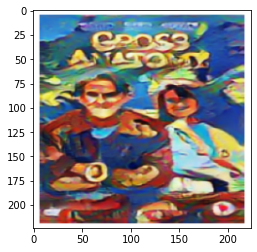

Original Genre Attachments:  []
Top Predicted Genres:  ['Comedy', 'Animation', 'Adventure', 'Action', 'Sci-Fi']


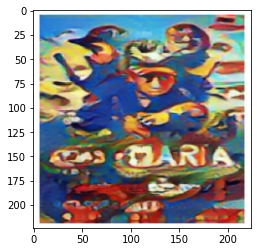

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Drama']


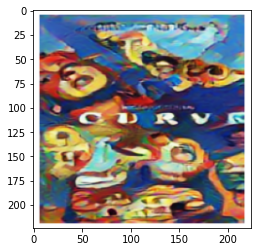

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Comedy', 'Action', 'Family']


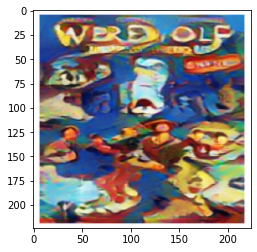

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


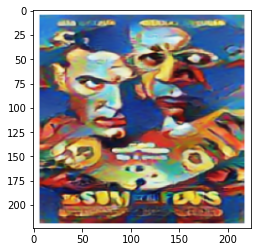

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Action', 'Family']


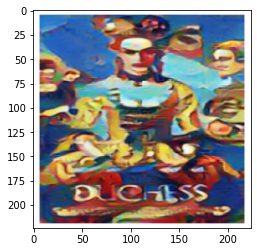

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Action', 'Family', 'Adventure']


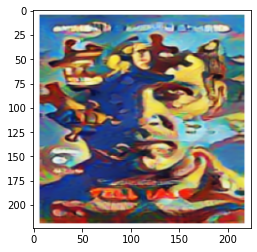

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Family', 'Comedy']


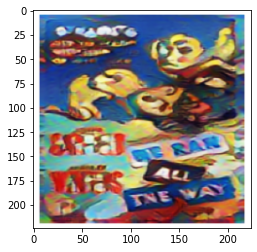

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Comedy', 'Adventure', 'Family', 'Action']


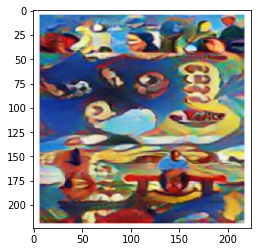

Original Genre Attachments:  []
Top Predicted Genres:  ['Animation', 'Adventure', 'Action', 'Comedy', 'Family']


In [44]:
sample_num = 100
top5_adventure = 0
top5_comedy = 0
top5_animation = 0
for i in range(sample_num):
  result = prediction_comparison(transformed_image[i], '', model, topk = 5)
  if 'Comedy' in result:
    top5_comedy += 1
  if 'Animation' in result:
    top5_animation += 1
  if 'Adventure' in result:
    top5_adventure += 1
top5_comedy /= sample_num
top5_animation /= sample_num
top5_adventure /= sample_num

In [45]:
print("The percentage of the genre 'Comedy' in the predicted list is: ", top5_comedy)
print("The percentage of the genre 'Animation' in the predicted list is: ", top5_animation)
print("The percentage of the genre 'Adventure' in the predicted list is: ", top5_adventure)

The percentage of the genre 'Comedy' in the predicted list is:  1.0
The percentage of the genre 'Animation' in the predicted list is:  0.99
The percentage of the genre 'Adventure' in the predicted list is:  0.98


From the above result, we could know that the model does a good job in classifying the movies with their posters, including the genres with the transformed images. The percentages of the genres 'Comedy', 'Animation', and 'Adventure'  in the predicted Top3 possible genre lists are 1.0, 0.99, and 0.98, which are high. 